In [1]:
import torch
import torchvision
from torch import nn, optim
from tqdm import tqdm
from torch.utils.data import DataLoader, Subset
from torchvision import transforms, utils
from torchvision.datasets import ImageFolder
from torchvision.utils import make_grid

import matplotlib.pyplot as plt
import numpy as np

import medmnist
from medmnist import INFO, Evaluator

In [41]:
DATASET = 'bloodmnist'
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
LR = 2e-4
BATCH_SIZE = 128
IMG_SIZE = 64
CHANNELS_IMG = 3
Z_DIM = 100
NUM_EPOCHS = 50
FEATURES_DISC = 64
FEATURES_GEN = 64

In [33]:
info = INFO[DATASET]
DataClass = getattr(medmnist, info['python_class'])

transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, ), (0.5, ))
])

dataset = DataClass(split='train', transform=transform, download=True)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

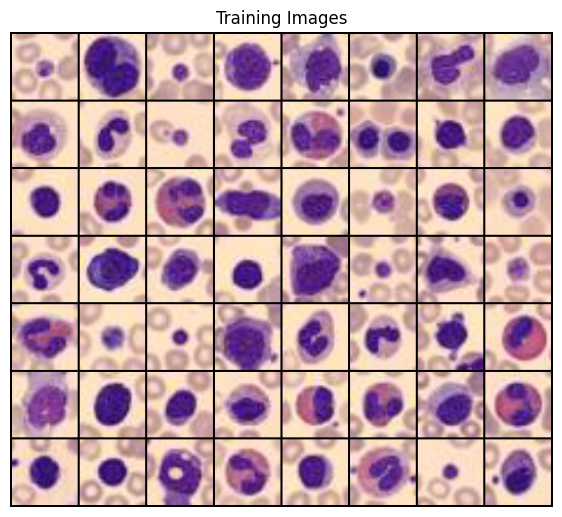

In [34]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(7, 7))
plt.axis('off')
plt.title('Training Images')
plt.imshow(np.transpose(make_grid(real_batch[0].to(DEVICE)[:56], padding=2, normalize=True).cpu(), (1, 2, 0)))

In [35]:
class Generator(nn.Module):
    def __init__(self, z_dim, channels_img, features_g):
        super(Generator, self).__init__()
        self.net = nn.Sequential(
            self._block(z_dim, features_g*16, 4, 1, 0),
            self._block(features_g*16, features_g*8, 4, 2, 1),
            self._block(features_g*8, features_g*4, 4, 2, 1),
            self._block(features_g*4, features_g*2, 4, 2, 1),
            nn.ConvTranspose2d(features_g*2, channels_img, kernel_size=4, stride=2, padding=1),
            nn.Tanh()
        )
        

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(
                in_channels,
                out_channels, 
                kernel_size, 
                stride, 
                padding, 
                bias=False
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU()
        )

    def forward(self, x):
        return self.net(x)

In [36]:
class Discriminator(nn.Module):
    def __init__(self, channels_img, features_d):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            nn.Conv2d(channels_img, features_d, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2),
            self._block(features_d, features_d*2, 4, 2, 1),
            self._block(features_d*2, features_d*4, 4, 2, 1),
            self._block(features_d*4, features_d*8, 4, 2, 1),
            nn.Conv2d(features_d*8, 1, kernel_size=4, stride=2, padding=0),
            nn.Sigmoid()
        )


    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels, 
                kernel_size, 
                stride, 
                padding, 
                bias=False
            ),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2)
        )

    def forward(self, x):
        return self.disc(x)

In [37]:
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, (nn.Conv2d, nn.ConvTranspose2d)):
            nn.init.normal_(m.weight.data, 0.0, 0.02)
        elif isinstance(m, nn.BatchNorm2d):
            nn.init.normal_(m.weight.data, 1.0, 0.02)
            nn.init.constant_(m.bias.data, 0)

gen = Generator(Z_DIM, CHANNELS_IMG, FEATURES_GEN).to(DEVICE)
disc = Discriminator(CHANNELS_IMG, FEATURES_DISC).to(DEVICE)

gen.apply(initialize_weights)
disc.apply(initialize_weights)

Discriminator(
  (disc): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2)
    (2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (3): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (4): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (5): Conv2d(512, 1, kernel_size=(4, 4), stride=(2, 2))
    (6): Sigmoid()
  )
)

In [38]:
opt_gen = optim.Adam(gen.parameters(), lr=LR, betas=(0.5, 0.999))
opt_disc = optim.Adam(disc.parameters(), lr=LR, betas=(0.5, 0.999))
criterion = nn.BCELoss()

fixed_noise = torch.randn(32, Z_DIM, 1, 1).to(DEVICE)

In [39]:
def show_tensor_images(image_tensor, num_images=32, size=(1, 64, 64)):
    image_tensor = (image_tensor + 1) / 2
    image_unflat = image_tensor.detach().cpu()
    image_grid = make_grid(image_unflat[:num_images], nrow=4)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

Epoch [0/50] Batch 0/94                   Loss D: 0.4590, loss G: 1.5240


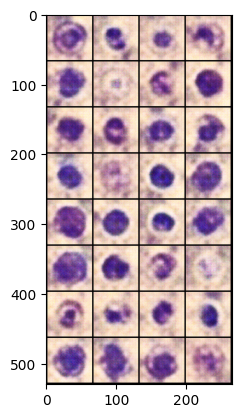

Epoch [0/50] Batch 50/94                   Loss D: 0.4937, loss G: 1.0424


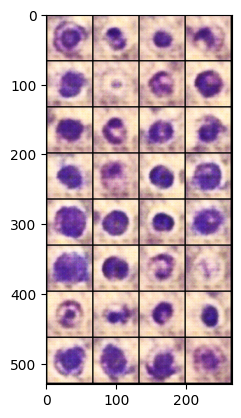

Epoch [1/50] Batch 0/94                   Loss D: 0.4733, loss G: 2.9645


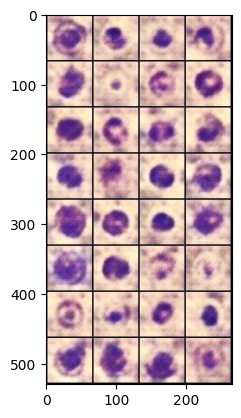

Epoch [1/50] Batch 50/94                   Loss D: 0.8284, loss G: 0.6774


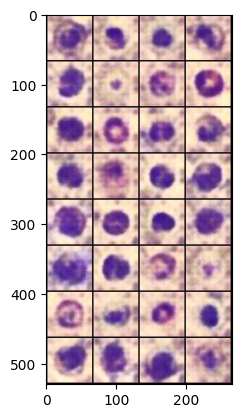

Epoch [2/50] Batch 0/94                   Loss D: 0.8141, loss G: 0.5349


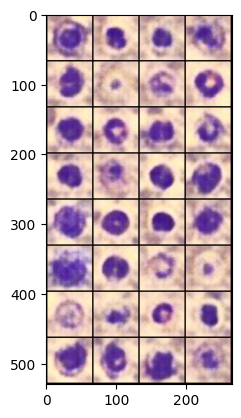

Epoch [2/50] Batch 50/94                   Loss D: 0.4955, loss G: 1.2976


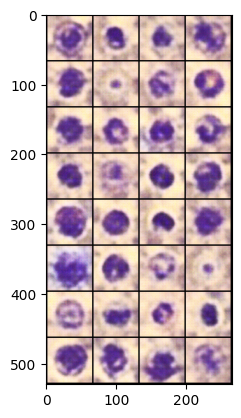

Epoch [3/50] Batch 0/94                   Loss D: 0.7931, loss G: 3.2748


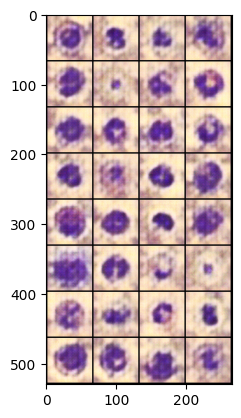

Epoch [3/50] Batch 50/94                   Loss D: 0.4457, loss G: 1.0988


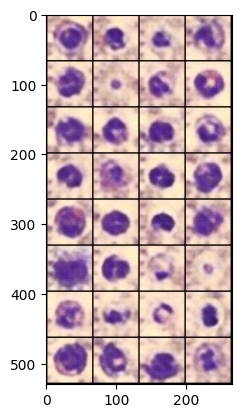

Epoch [4/50] Batch 0/94                   Loss D: 0.5774, loss G: 3.7070


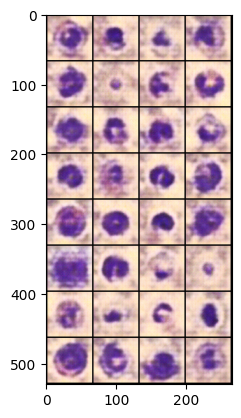

Epoch [4/50] Batch 50/94                   Loss D: 0.4742, loss G: 1.1677


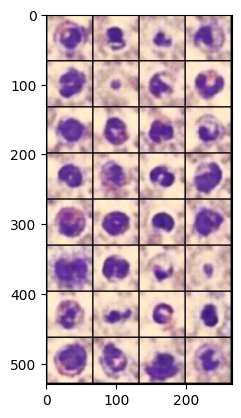

Epoch [5/50] Batch 0/94                   Loss D: 0.5849, loss G: 2.1800


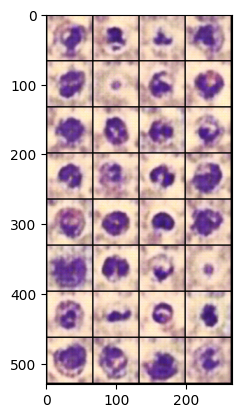

Epoch [5/50] Batch 50/94                   Loss D: 0.4111, loss G: 2.7530


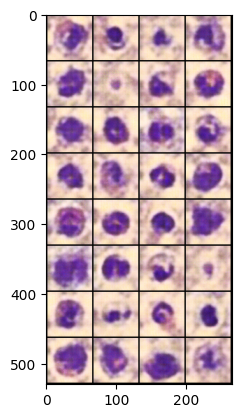

Epoch [6/50] Batch 0/94                   Loss D: 0.5103, loss G: 1.3988


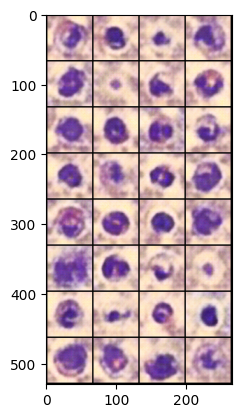

Epoch [6/50] Batch 50/94                   Loss D: 0.2967, loss G: 2.5914


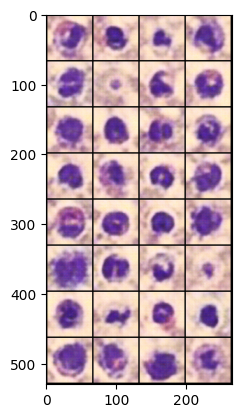

Epoch [7/50] Batch 0/94                   Loss D: 0.5447, loss G: 1.0942


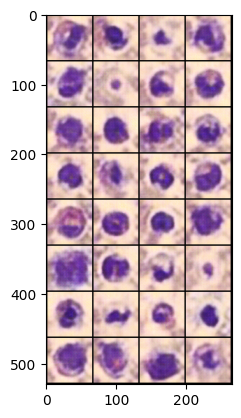

Epoch [7/50] Batch 50/94                   Loss D: 0.4107, loss G: 2.0042


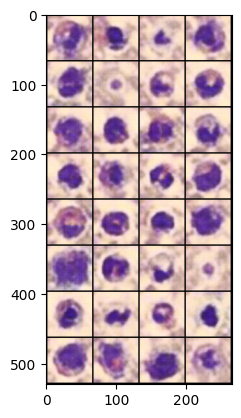

Epoch [8/50] Batch 0/94                   Loss D: 0.6556, loss G: 4.4305


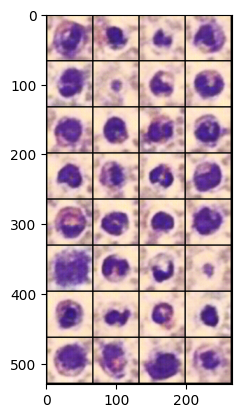

Epoch [8/50] Batch 50/94                   Loss D: 0.3952, loss G: 2.3024


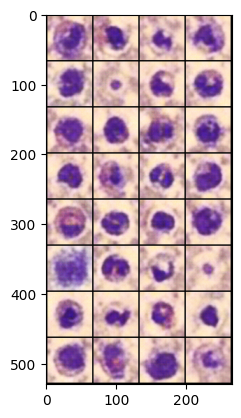

Epoch [9/50] Batch 0/94                   Loss D: 0.6107, loss G: 0.8647


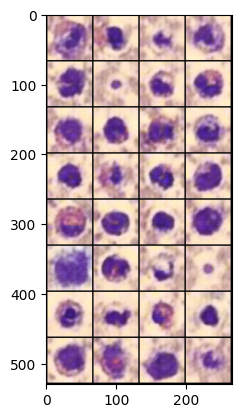

Epoch [9/50] Batch 50/94                   Loss D: 0.3925, loss G: 2.5299


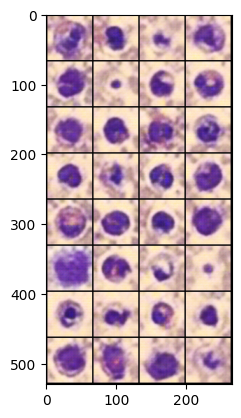

Epoch [10/50] Batch 0/94                   Loss D: 0.5042, loss G: 0.7832


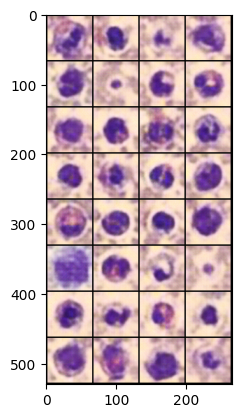

Epoch [10/50] Batch 50/94                   Loss D: 0.5895, loss G: 2.3234


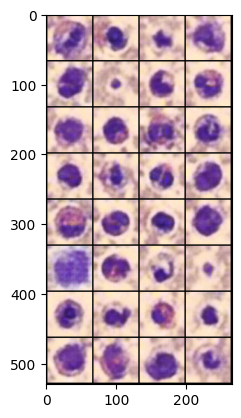

Epoch [11/50] Batch 0/94                   Loss D: 0.5033, loss G: 2.4831


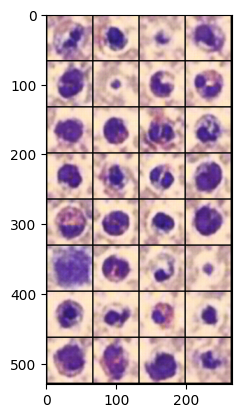

Epoch [11/50] Batch 50/94                   Loss D: 0.6522, loss G: 2.2133


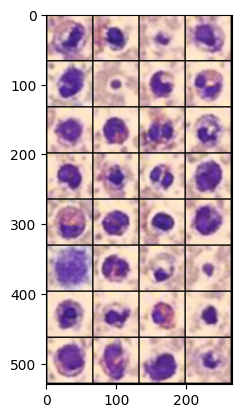

Epoch [12/50] Batch 0/94                   Loss D: 0.4161, loss G: 1.4539


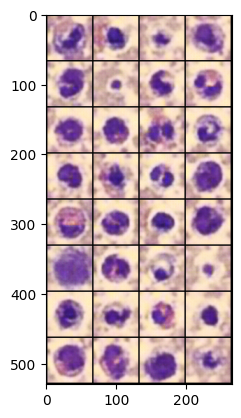

Epoch [12/50] Batch 50/94                   Loss D: 0.4961, loss G: 1.7761


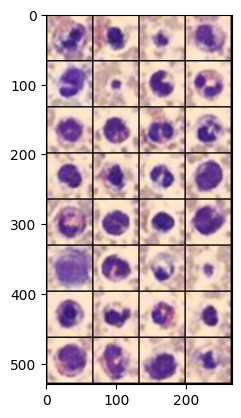

Epoch [13/50] Batch 0/94                   Loss D: 0.5155, loss G: 3.6431


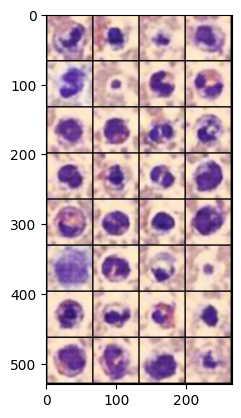

Epoch [13/50] Batch 50/94                   Loss D: 0.4244, loss G: 2.1202


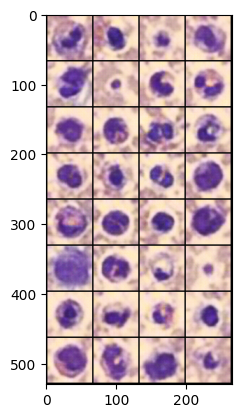

Epoch [14/50] Batch 0/94                   Loss D: 0.9158, loss G: 0.3566


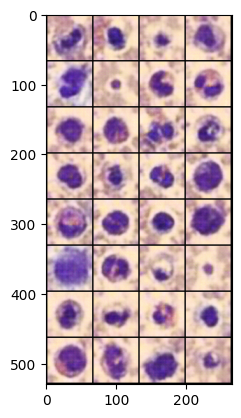

Epoch [14/50] Batch 50/94                   Loss D: 0.4400, loss G: 1.5168


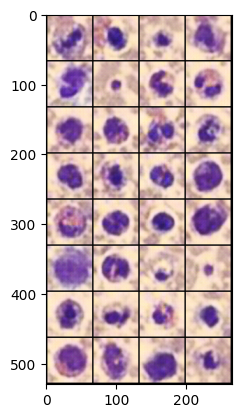

Epoch [15/50] Batch 0/94                   Loss D: 0.6294, loss G: 0.9794


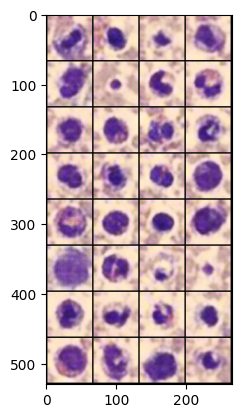

Epoch [15/50] Batch 50/94                   Loss D: 0.3705, loss G: 1.8836


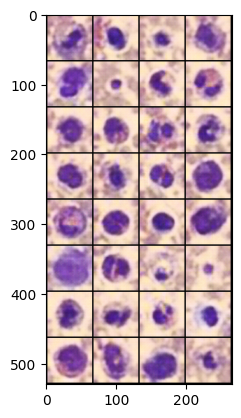

Epoch [16/50] Batch 0/94                   Loss D: 0.4768, loss G: 4.4874


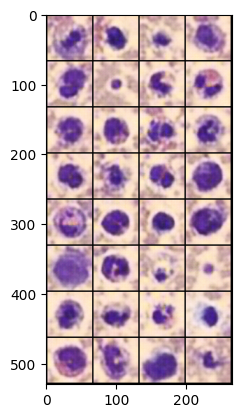

Epoch [16/50] Batch 50/94                   Loss D: 0.4280, loss G: 1.7162


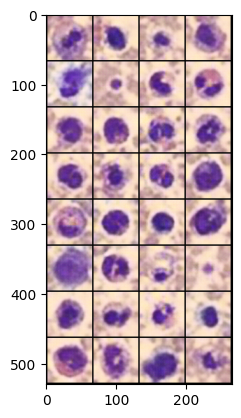

Epoch [17/50] Batch 0/94                   Loss D: 0.4405, loss G: 1.7501


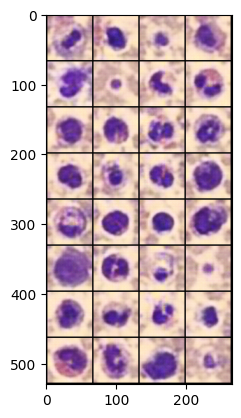

Epoch [17/50] Batch 50/94                   Loss D: 0.4763, loss G: 1.8061


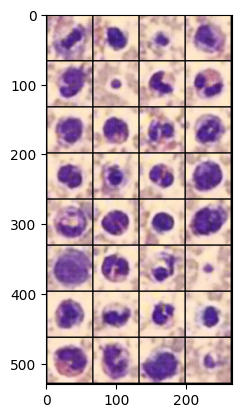

Epoch [18/50] Batch 0/94                   Loss D: 0.5071, loss G: 1.1585


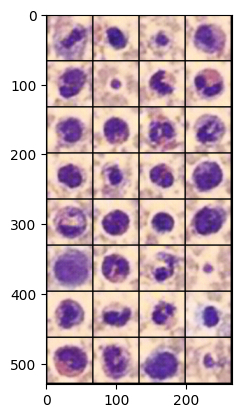

Epoch [18/50] Batch 50/94                   Loss D: 0.1981, loss G: 1.9014


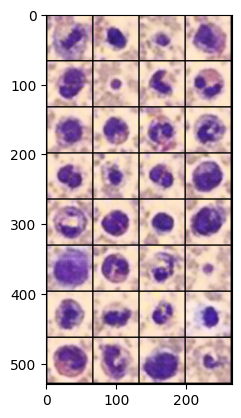

Epoch [19/50] Batch 0/94                   Loss D: 0.5760, loss G: 3.4468


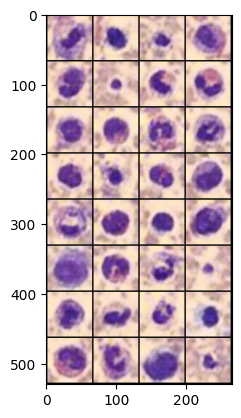

Epoch [19/50] Batch 50/94                   Loss D: 0.5815, loss G: 1.0992


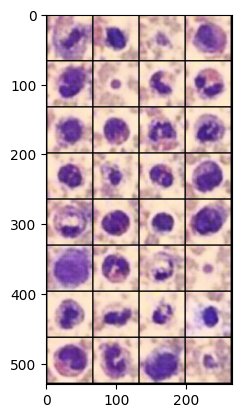

Epoch [20/50] Batch 0/94                   Loss D: 0.3738, loss G: 4.0298


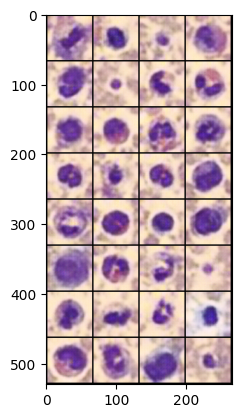

Epoch [20/50] Batch 50/94                   Loss D: 0.2967, loss G: 2.4660


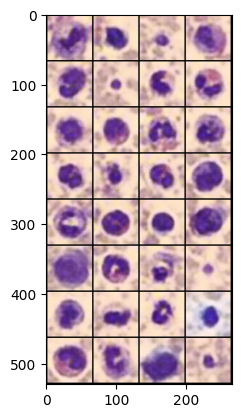

Epoch [21/50] Batch 0/94                   Loss D: 0.1138, loss G: 2.9998


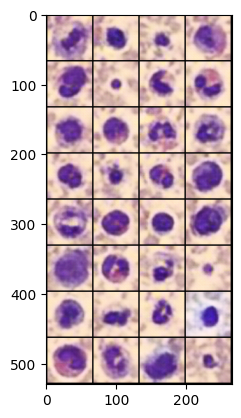

Epoch [21/50] Batch 50/94                   Loss D: 0.4258, loss G: 2.8807


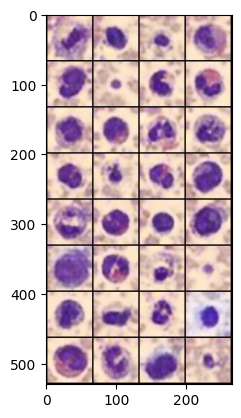

Epoch [22/50] Batch 0/94                   Loss D: 0.2297, loss G: 2.9368


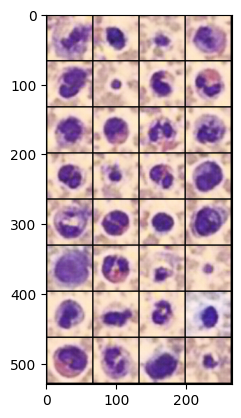

Epoch [22/50] Batch 50/94                   Loss D: 0.5083, loss G: 6.5306


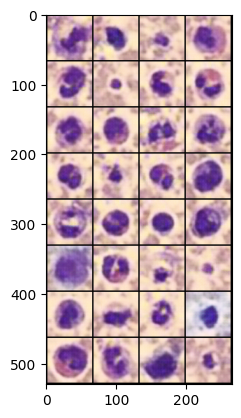

Epoch [23/50] Batch 0/94                   Loss D: 0.1976, loss G: 2.9941


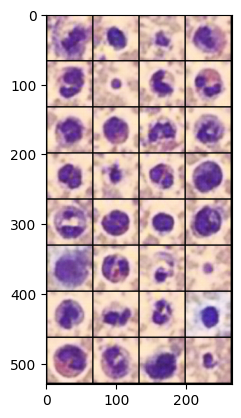

Epoch [23/50] Batch 50/94                   Loss D: 0.2381, loss G: 1.8884


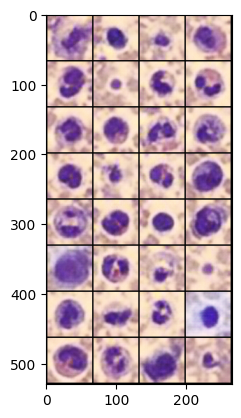

Epoch [24/50] Batch 0/94                   Loss D: 0.2119, loss G: 1.8342


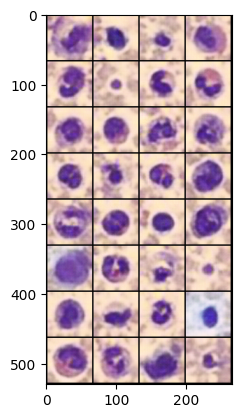

Epoch [24/50] Batch 50/94                   Loss D: 0.3630, loss G: 2.3244


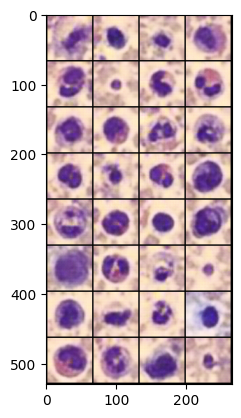

Epoch [25/50] Batch 0/94                   Loss D: 0.3668, loss G: 1.5289


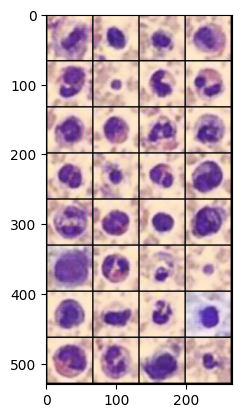

Epoch [25/50] Batch 50/94                   Loss D: 0.4800, loss G: 2.5930


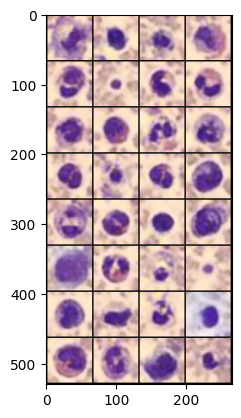

Epoch [26/50] Batch 0/94                   Loss D: 0.6668, loss G: 3.3573


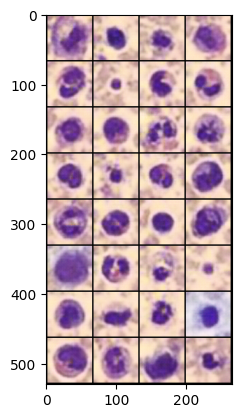

Epoch [26/50] Batch 50/94                   Loss D: 0.6438, loss G: 4.5901


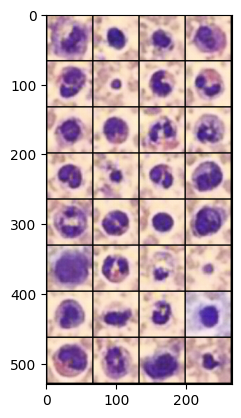

Epoch [27/50] Batch 0/94                   Loss D: 0.0605, loss G: 4.7126


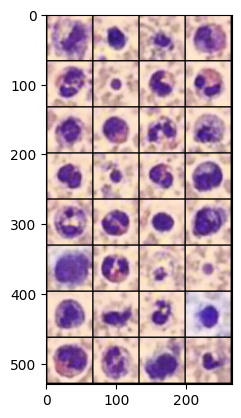

Epoch [27/50] Batch 50/94                   Loss D: 0.3480, loss G: 2.3359


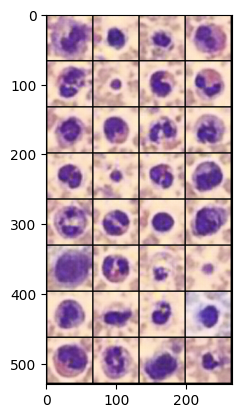

Epoch [28/50] Batch 0/94                   Loss D: 0.1915, loss G: 3.1664


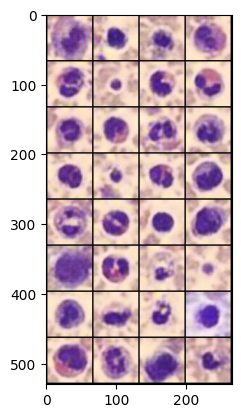

Epoch [28/50] Batch 50/94                   Loss D: 0.2573, loss G: 2.5537


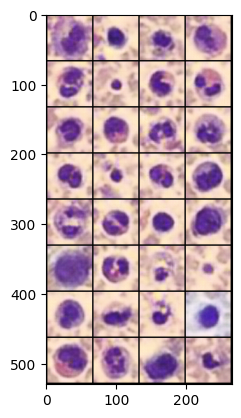

Epoch [29/50] Batch 0/94                   Loss D: 0.0616, loss G: 4.3420


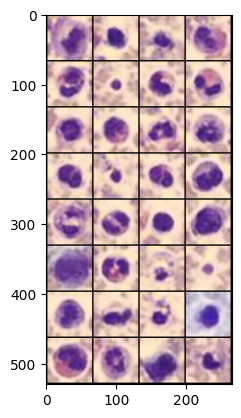

Epoch [29/50] Batch 50/94                   Loss D: 1.0936, loss G: 4.7603


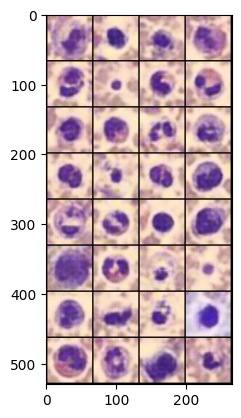

Epoch [30/50] Batch 0/94                   Loss D: 0.7340, loss G: 3.8732


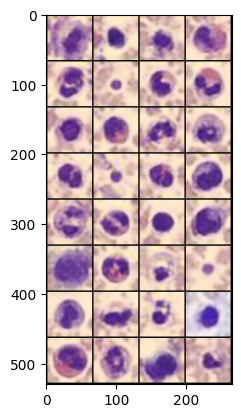

Epoch [30/50] Batch 50/94                   Loss D: 0.0451, loss G: 2.8540


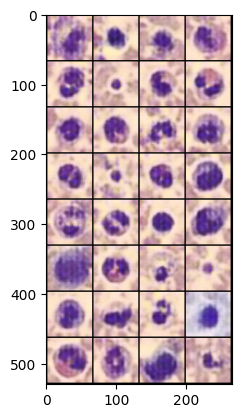

Epoch [31/50] Batch 0/94                   Loss D: 0.1982, loss G: 3.1479


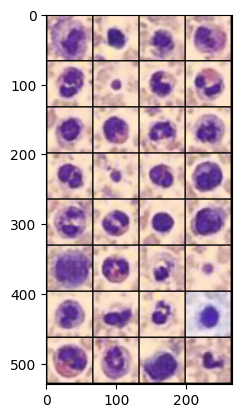

Epoch [31/50] Batch 50/94                   Loss D: 0.2035, loss G: 4.3292


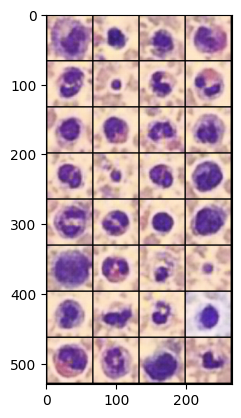

Epoch [32/50] Batch 0/94                   Loss D: 0.2992, loss G: 4.3001


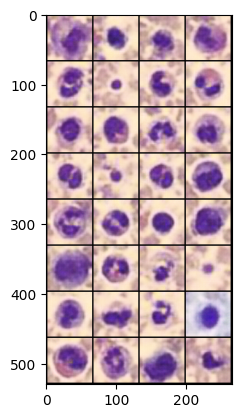

Epoch [32/50] Batch 50/94                   Loss D: 0.0785, loss G: 3.3869


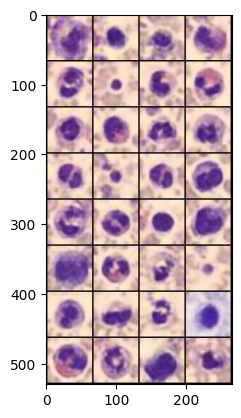

Epoch [33/50] Batch 0/94                   Loss D: 1.7180, loss G: 4.4421


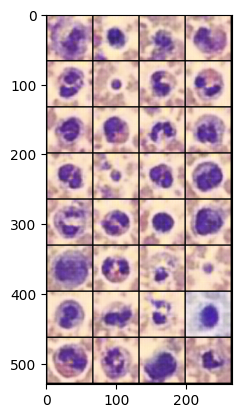

Epoch [33/50] Batch 50/94                   Loss D: 0.6813, loss G: 4.2798


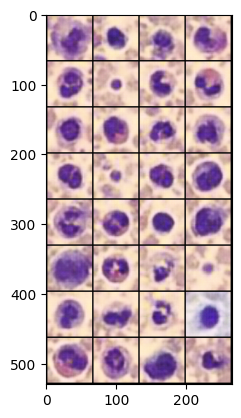

Epoch [34/50] Batch 0/94                   Loss D: 0.3410, loss G: 4.3529


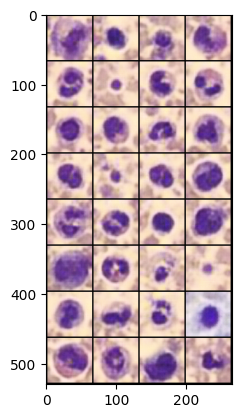

Epoch [34/50] Batch 50/94                   Loss D: 0.2069, loss G: 3.3883


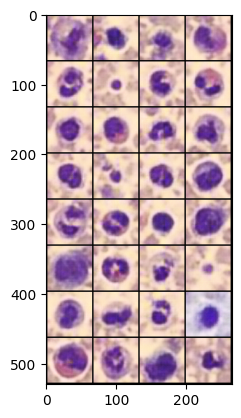

Epoch [35/50] Batch 0/94                   Loss D: 0.4453, loss G: 7.2905


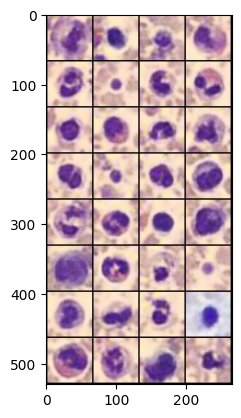

Epoch [35/50] Batch 50/94                   Loss D: 0.0472, loss G: 3.4788


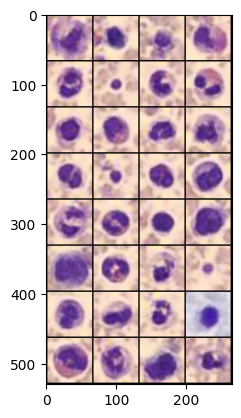

Epoch [36/50] Batch 0/94                   Loss D: 0.1504, loss G: 1.8379


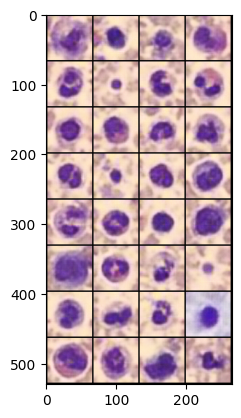

Epoch [36/50] Batch 50/94                   Loss D: 0.1677, loss G: 1.8917


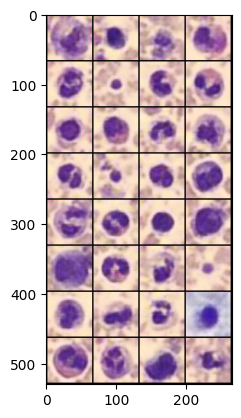

Epoch [37/50] Batch 0/94                   Loss D: 0.4190, loss G: 4.8013


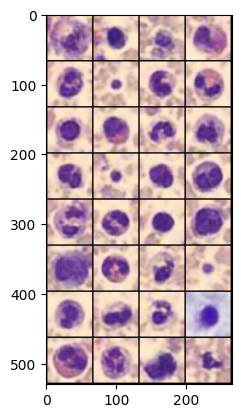

Epoch [37/50] Batch 50/94                   Loss D: 0.1566, loss G: 2.5353


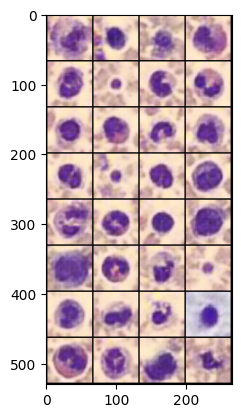

Epoch [38/50] Batch 0/94                   Loss D: 0.1365, loss G: 2.4391


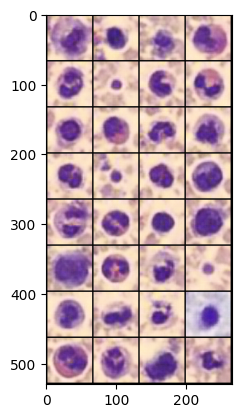

Epoch [38/50] Batch 50/94                   Loss D: 0.2067, loss G: 2.8167


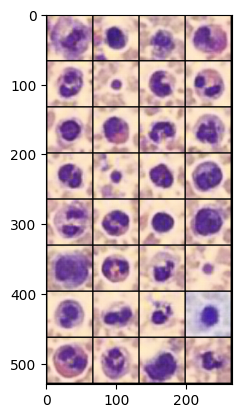

Epoch [39/50] Batch 0/94                   Loss D: 0.4012, loss G: 1.6327


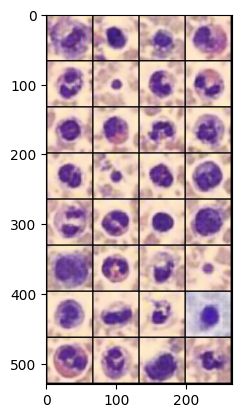

Epoch [39/50] Batch 50/94                   Loss D: 0.4408, loss G: 2.8605


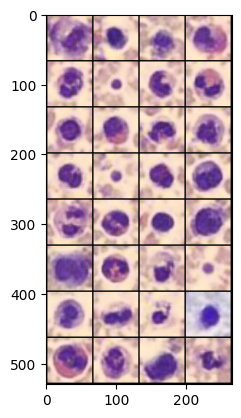

Epoch [40/50] Batch 0/94                   Loss D: 0.0841, loss G: 3.5152


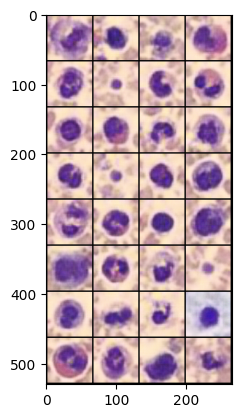

Epoch [40/50] Batch 50/94                   Loss D: 0.1304, loss G: 4.2336


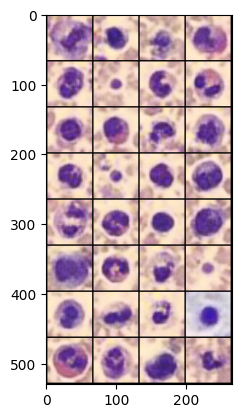

Epoch [41/50] Batch 0/94                   Loss D: 0.0453, loss G: 2.8465


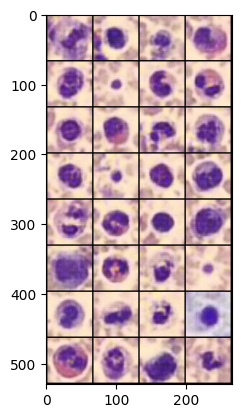

Epoch [41/50] Batch 50/94                   Loss D: 0.2423, loss G: 3.5952


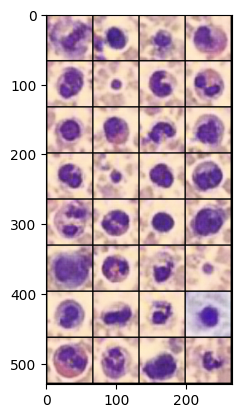

Epoch [42/50] Batch 0/94                   Loss D: 0.3437, loss G: 3.1633


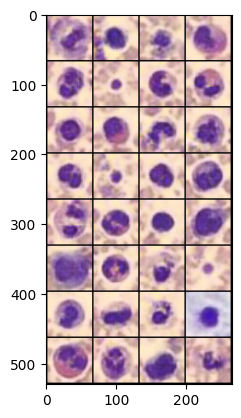

Epoch [42/50] Batch 50/94                   Loss D: 0.0449, loss G: 4.2331


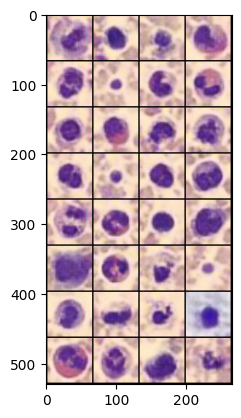

Epoch [43/50] Batch 0/94                   Loss D: 0.1411, loss G: 2.7066


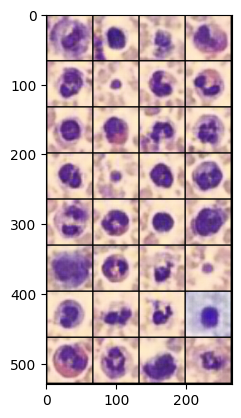

Epoch [43/50] Batch 50/94                   Loss D: 0.6406, loss G: 5.7837


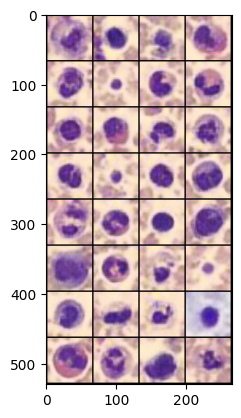

Epoch [44/50] Batch 0/94                   Loss D: 0.0985, loss G: 4.5464


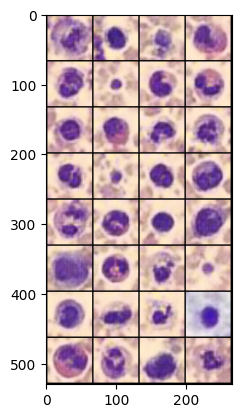

Epoch [44/50] Batch 50/94                   Loss D: 0.0797, loss G: 3.3326


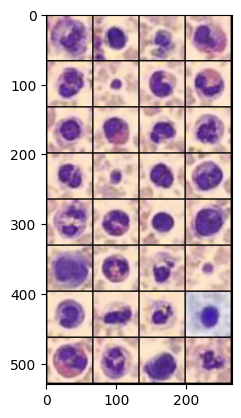

Epoch [45/50] Batch 0/94                   Loss D: 0.1847, loss G: 3.3827


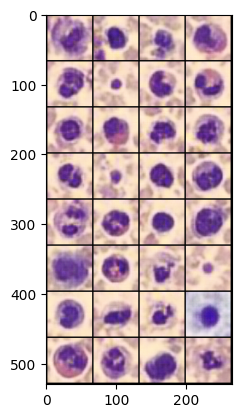

Epoch [45/50] Batch 50/94                   Loss D: 0.1351, loss G: 3.3208


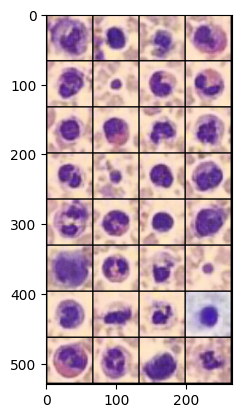

Epoch [46/50] Batch 0/94                   Loss D: 0.1215, loss G: 2.6774


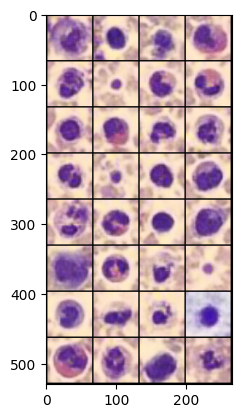

Epoch [46/50] Batch 50/94                   Loss D: 0.2449, loss G: 4.0450


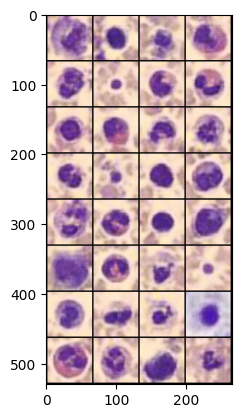

Epoch [47/50] Batch 0/94                   Loss D: 0.6751, loss G: 1.8458


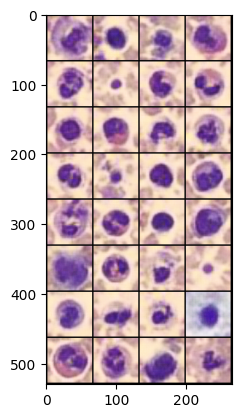

Epoch [47/50] Batch 50/94                   Loss D: 0.3489, loss G: 4.5504


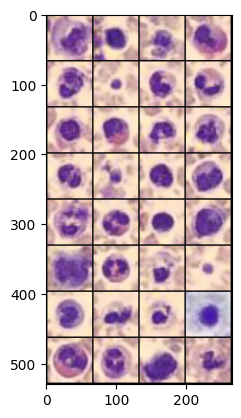

Epoch [48/50] Batch 0/94                   Loss D: 0.1396, loss G: 2.4557


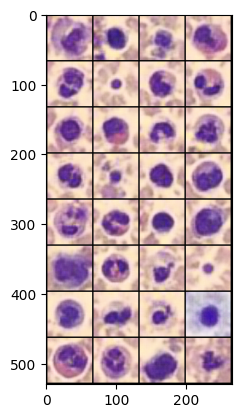

Epoch [48/50] Batch 50/94                   Loss D: 0.2974, loss G: 1.2826


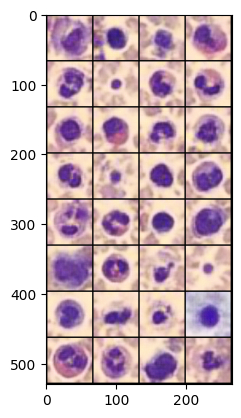

Epoch [49/50] Batch 0/94                   Loss D: 0.0520, loss G: 4.0651


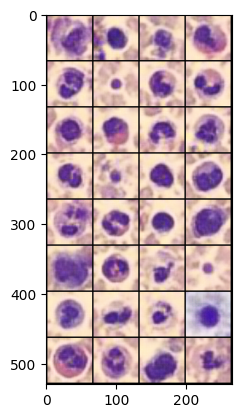

Epoch [49/50] Batch 50/94                   Loss D: 0.0154, loss G: 6.1170


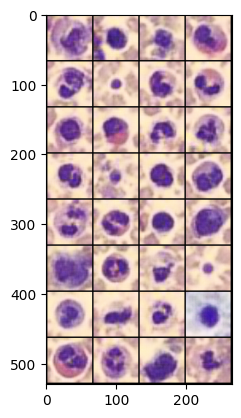

In [42]:
gen.train()
disc.train()

for epoch in range(NUM_EPOCHS):
    for batch_idx, (real, _ ) in enumerate(dataloader):
        real = real.to(DEVICE)
        ### create noise tensor
        noise = torch.randn((BATCH_SIZE, Z_DIM, 1, 1)).to(DEVICE)
        fake = gen(noise)

        ### Train Discriminator: max log(D(x)) + log(1 - D(G(z)))
        disc_real = disc(real).reshape(-1)
        loss_disc_real = criterion(disc_real, torch.ones_like(disc_real))
        disc_fake = disc(fake.detach()).reshape(-1)
        loss_disc_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
        loss_disc = (loss_disc_real + loss_disc_fake) / 2
        disc.zero_grad()
        loss_disc.backward()
        opt_disc.step()

        ### Train Generator: min log(1 - D(G(z))) <-> max log(D(G(z))
        output = disc(fake).reshape(-1)
        loss_gen = criterion(output, torch.ones_like(output))
        gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        ### Print losses occasionally and fake images occasionally
        if batch_idx % 50 == 0:
            print(
                f"Epoch [{epoch}/{NUM_EPOCHS}] Batch {batch_idx}/{len(dataloader)} \
                  Loss D: {loss_disc:.4f}, loss G: {loss_gen:.4f}"
            )
            with torch.no_grad():
                fake = gen(fixed_noise)
                img_grid_real = torchvision.utils.make_grid(real[:32], normalize=True)
                img_grid_fake = torchvision.utils.make_grid(fake[:32], normalize=True)
                show_tensor_images(fake)

In [43]:
torch.save(gen.state_dict(), "generator_dcgan.pth")
torch.save(disc.state_dict(), "discriminator_dcgan.pth")